In [9]:
#%%writefile Get_FastPulse.py
#import ROOT
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import curve_fit
import scipy.stats as stats 
import numpy as np
from scipy.fftpack import fft,ifft
from scipy.optimize import curve_fit
#label text
#############

amp=np.load(r"G:/CDEX/wave_par/E_424_t7.npy")
par=np.load(r"E:\CDEX\0vbb\Code\AE_par\Ecali_par.npy")
#E=par[0]+amp*par[1]

In [10]:
def gaus(x,n,miu,sigma):
    t=-(x-miu)**2/(2*sigma**2)
    return n*np.exp(t)
def pol(x,a,b,c):
    return a+b*x+c*x**2
def gaus_pol(x,n,miu,sigma,a,b,c):
    return gaus(x,n,miu,sigma)+pol(x,a,b,c)
def my_tanh(x,c,w,h):       #center,width,height
    return h*np.tanh((x-c)/w)
def peak_curve(x,n,miu,sigma,a,b,c):#,w,h):
    return gaus(x,n,miu,sigma)+pol(x,a,b,c)#my_tanh(x,miu,w,h)#+pol(x,a,b,0)
def linear(x,a,b):
    return a+b*x

(200000, 4) (6000,)
[0.36943361 1.39136907]
(200000, 4) (6000,)
[0.27504764 0.73095165]
(200000, 4) (6000,)
[0.55403691 1.93165471]
(200000, 4) (14000,)
[-204.20152347    0.30337389]


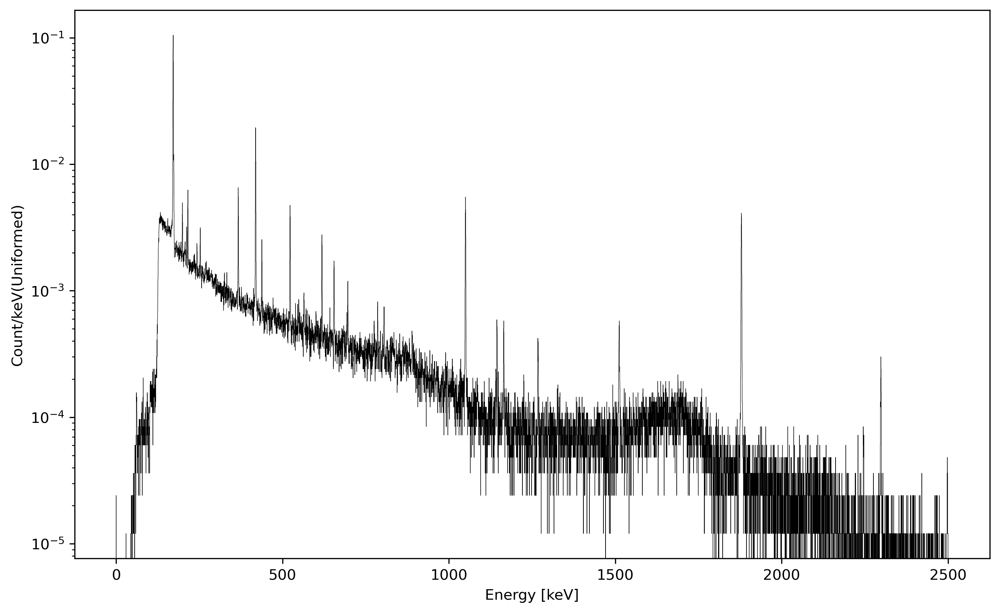

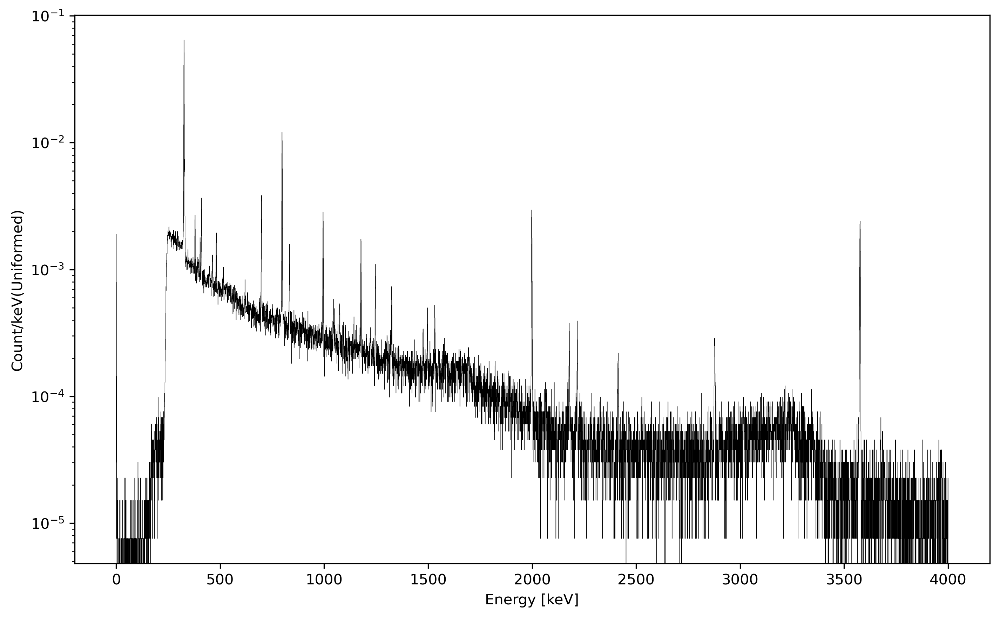

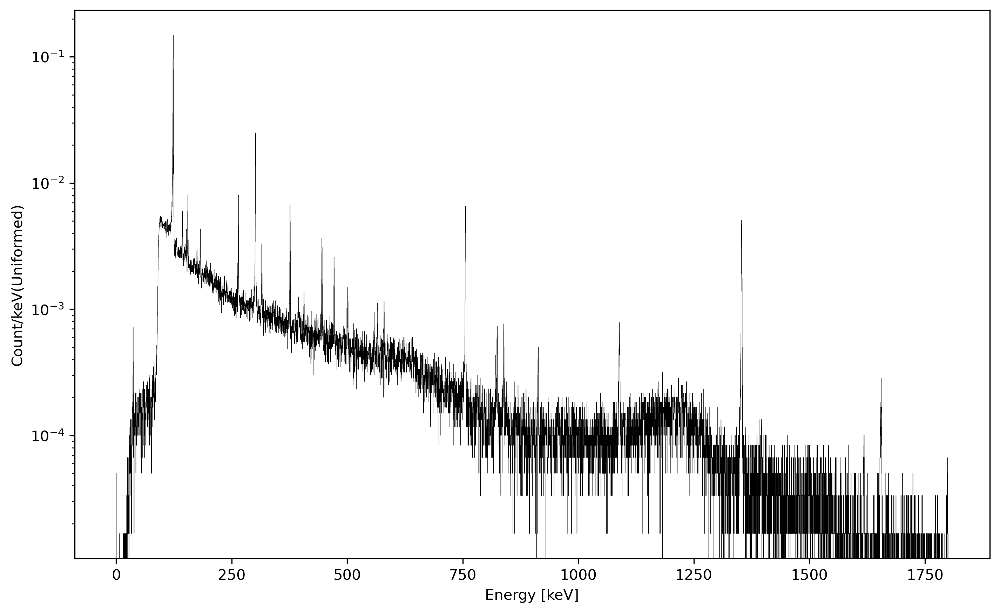

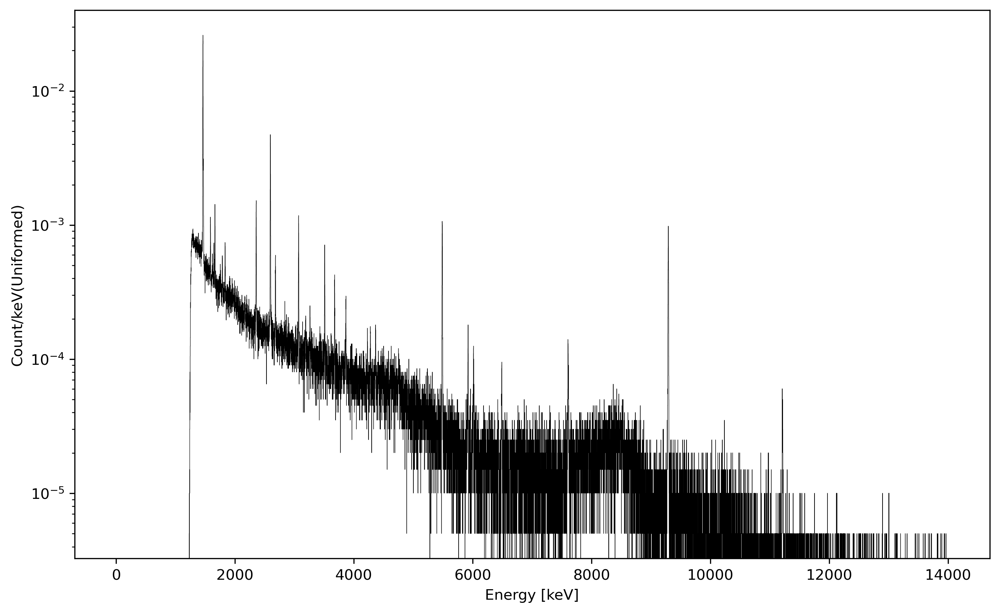

In [39]:
#draw spectrum
x_label="Energy [keV]"
y_label="Count/keV(Uniformed)"

#############
FEP=[238.63,583.19,1460.82,2614.51]
peak_range_t3=[[[80,90],[204,214],[517,527],[930,940]],\
            [[155,170],[390,405],[985,1000],[1770,1785]],\
           [[57,65],[146,154],[371,381],[669,679]],\
           [[1450,1480],[2580,2620],[5470,5510],[9270,9316]]]
#############
peak_range_t7=[[[167,177],[415,425],[1045,1055],[1875,1885]],\
            [[320,330],[793,808],[1990,2005],[3565,3585]],\
           [[118,127],[295,310],[750,762],[1345,1360]],\
           [[1450,1480],[2580,2620],[5470,5510],[9270,9316]]]
bins_=[6000,6000,6000,14000]

range_t3=[1400,2500,1000,14000]
range_t7=[2500,4000,1800,14000]

FWHM=[]
FWHMerr=[]
Linear_par=[]
linear_err=[]


for Eway in range(4):
    fig, ax = plt.subplots(1,1,figsize=(10, 6),dpi=300)
    spec,bins,patchs=ax.hist(amp[:,Eway],bins=bins_[Eway],range=[0,range_t7[Eway]],density=True,histtype='step',log=True,\
                          linewidth=0.3,color=['black'])#,'blue','red','green'
    ax.set(xlabel=x_label,ylabel=y_label)
    #ax.plot(bins,spec,linewidth=0.3,color='black')
    plt.subplots_adjust(left=0.10, bottom=0.10, right=0.97, top=0.97,
                    wspace=0.15, hspace=0.25)

    #fig.tight_layout()
    #fig.savefig(r"E:\CDEX\0vbb\Figure\Spectrum\E_t3.png")
    print(amp.shape,spec.shape)
    
################
    Fit_par=[]
    Par_err=[]
    fig, ax = plt.subplots(1,4,figsize=(12, 5),dpi=1200)

    for i in range(4):

        L=int(peak_range_t7[Eway][i][0]/(bins[1]-bins[0]))
        H=int(peak_range_t7[Eway][i][1]/(bins[1]-bins[0]))
        y=spec[L:H]
        x=bins[L:H]

        bound=([0.001,bins[L],0.05,-1, -0.01, -0.001],\
               [0.200,bins[H],4.0, 1,  0.01, 0.001])  #gaus_pol(x,n,miu,sigma,a,b,c)

        #np.linspace(L,H,H-L,endpoint=False)
        opt,cov=curve_fit(gaus_pol,x,y,bounds=bound)

        gaus_=gaus(x,opt[0],opt[1],opt[2])
        pol_=pol(x,opt[3],opt[4],opt[5])
        ax[i].plot(x,gaus_,label="gauss",linewidth=1)
        ax[i].plot(x,pol_,label="pol",linewidth=1)
        ax[i].step(x,y,label="peak",where='mid',linewidth=1)
        ax[i].plot(x,gaus_+pol_,label="fit",linestyle="--",linewidth=1)
        ax[i].tick_params(labelsize=6)
        Fit_par.append(opt)
        Par_err.append(np.sqrt(np.diag(cov)))
        
    plt.subplots_adjust(left=0.10, bottom=0.10, right=0.97, top=0.97,
                wspace=0.15, hspace=0.25)
    fig.savefig(r"E:\CDEX\0vbb\Figure\E\peak_fit%d.png"%Eway)
    
    plt.legend()
    y=np.array(Fit_par)[:,1]     #get the fit par : miu
    y_err= np.array(Par_err)[:,1] #get sigma of miu (err)
    x=np.array(FEP)              #related full energy peak
    par,cov=curve_fit(linear,y,x)
    Linear_par.append(par)
    print(par)
        
        
        
    FWHM.append(np.array(Fit_par)[:,2]*2.355*par[1])
    FWHMerr.append(np.array(Par_err)[:,2]*2.355*par[1])


In [40]:
x=np.array(FEP)              #related full energy peak
fig, ax = plt.subplots(1,1,figsize=(10, 6),dpi=1200)
print(FWHM)
Eway_name=['Trapezoid','ZAC','MWA','Main amp']
for i in range(4):
    ax.errorbar(x,FWHM[i],yerr=FWHMerr[i],label=Eway_name[i])
    ax.set(xlabel='E(keV)',ylabel='FWHM(keV)')
    #ax.errorbar(x,y,yerr=y_err,fmt="o",markersize=3)
    ax.legend()
plt.subplots_adjust(left=0.10, bottom=0.10, right=0.97, top=0.97,
                wspace=0.15, hspace=0.25)
fig.savefig(r"E:\CDEX\0vbb\Figure\E\FWHM_t7.png")


[array([1.55485828, 1.70744648, 2.16300234, 2.56434348]), array([1.29550246, 1.60781438, 2.05526208, 2.47821149]), array([1.36038679, 1.73291397, 2.35974286, 2.86701281]), array([1.37889831, 1.6528191 , 2.37618558, 2.55830322])]


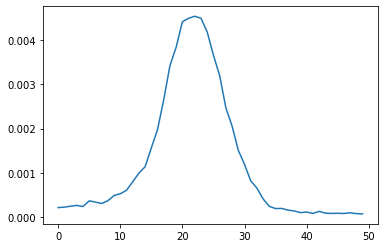

In [135]:
x=np.linspace(0,10,100)
y=gaus_pol(x,1,5,1,1,0.01,0.001)

z=my_tanh(x,5,2,3)
x=np.linspace(1000,1400,40,endpoint=False)
plt.plot(spec[6200:6250])

ValueError: operands could not be broadcast together with shapes (50,) (40,) 

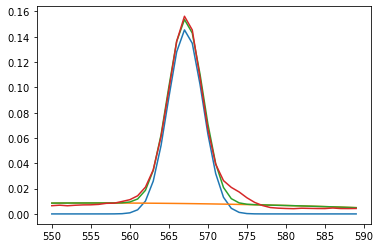

In [123]:
gaus_=gaus(x,opt[0],opt[1],opt[2])
pol_=pol(x,opt[3],opt[4],opt[5])
#my_tanh_=my_tanh(x,opt[1],opt[5],opt[6])
plt.plot(x,gaus_)
plt.plot(x,pol_)
#plt.plot(x,my_tanh_)
plt.plot(x,gaus_+pol_)
plt.plot(x,spec[550:590])

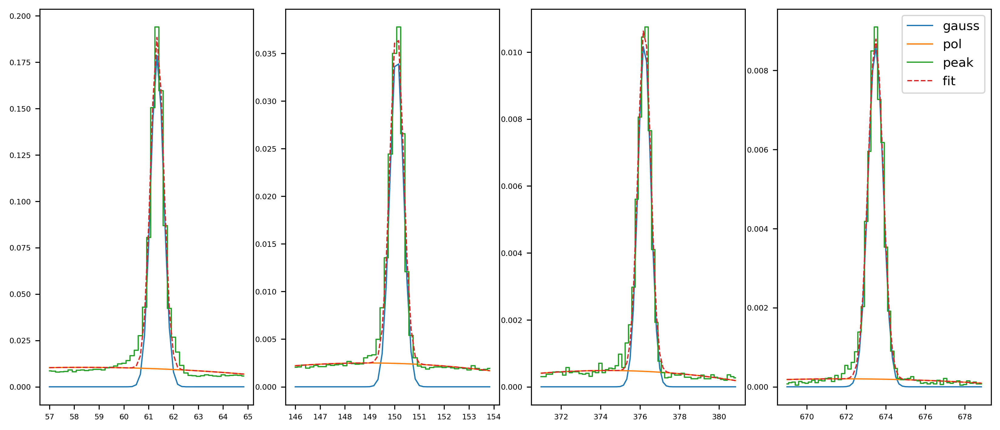

In [109]:
#### peak fit,use gaussian + polynomial

Fit_par=[]
Par_err=[]
fig, ax = plt.subplots(1,4,figsize=(12, 5),dpi=300)

for i in range(4):
    
    L=int(peak_range[Eway][i][0]/(bins[1]-bins[0]))
    H=int(peak_range[Eway][i][1]/(bins[1]-bins[0]))
    y=spec[L:H]
    x=bins[L:H]
    
    bound=([0.001,bins[L],0.1,-1, -0.01, -0.001],\
           [0.200,bins[H],4.0, 1,  0.01, 0.001])  #gaus_pol(x,n,miu,sigma,a,b,c)

    #np.linspace(L,H,H-L,endpoint=False)
    opt,cov=curve_fit(gaus_pol,x,y,bounds=bound)
    
    gaus_=gaus(x,opt[0],opt[1],opt[2])
    pol_=pol(x,opt[3],opt[4],opt[5])
    ax[i].plot(x,gaus_,label="gauss",linewidth=1)
    ax[i].plot(x,pol_,label="pol",linewidth=1)
    ax[i].step(x,y,label="peak",where='mid',linewidth=1)
    ax[i].plot(x,gaus_+pol_,label="fit",linestyle="--",linewidth=1)
    ax[i].tick_params(labelsize=6)
    Fit_par.append(opt)
    Par_err.append(np.sqrt(np.diag(cov)))

plt.legend()
plt.subplots_adjust(left=0.10, bottom=0.10, right=0.97, top=0.97,
                wspace=0.15, hspace=0.25)
plt.show()
#fig.savefig(r"E:\CDEX\0vbb\Figure\E\MWA_cali_peak.png")

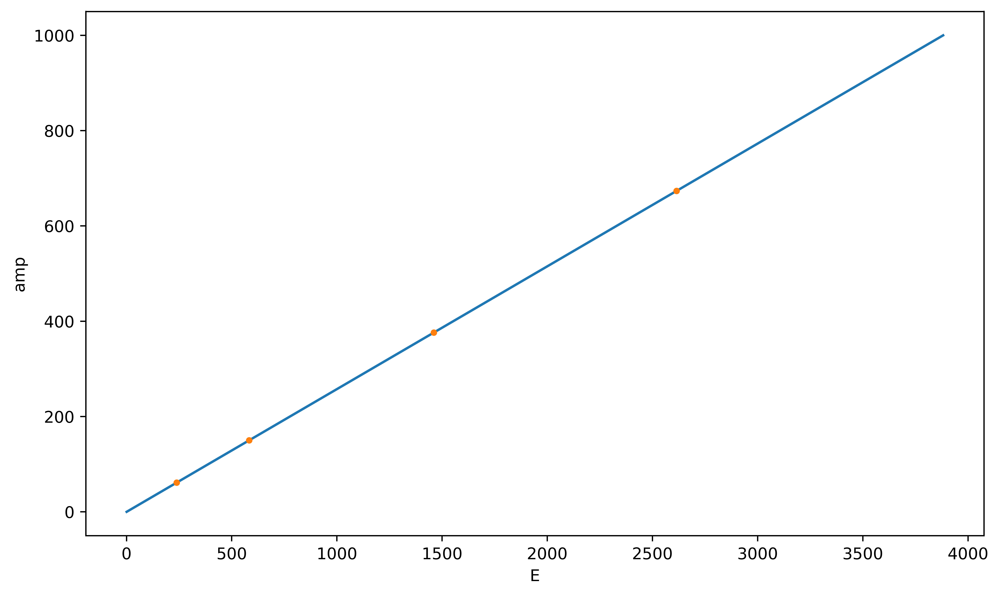

[0.00498581 0.00428279 0.00479062 0.00525592]


In [110]:
###energy scale
y=np.array(Fit_par)[:,1]     #get the fit par : miu
y_err= np.array(Par_err)[:,1] #get sigma of miu (err)
x=np.array(FEP)              #related full energy peak

par,cov=curve_fit(linear,y,x)
np.save(r"E:\CDEX\0vbb\Code\AE_par\Ecali_par%d"%Eway,par)
np.save(r"E:\CDEX\0vbb\Code\AE_par\Ecali_err%d"%Eway,y_err)
amp_x=np.linspace(0,1000,100)
E=linear(amp_x,par[0],par[1])

fig, ax = plt.subplots(1,1,figsize=(10, 6),dpi=900)
ax.plot(E,amp_x)
ax.errorbar(x,y,yerr=y_err,fmt="o",markersize=3)
ax.set(xlabel="E",ylabel="amp")
plt.show()
# for opt in Fit_par:
#     print(opt)

print(y_err)
fig.savefig(r"E:\CDEX\0vbb\Figure\E\MWA_cali.png")

ValueError: x and y must have same first dimension, but have shapes (4,) and (2,)

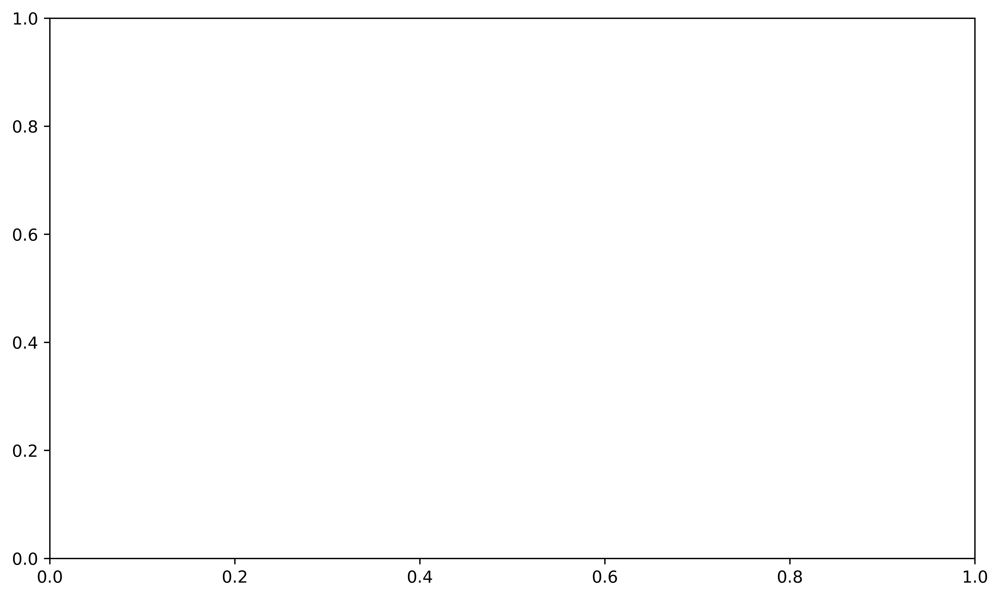

In [112]:
####print E FWHM
fig, ax = plt.subplots(1,1,figsize=(10, 6),dpi=900)
err=[]
FWHM=[]
for i in range(4):
    FWHM.append(np.load(r"E:\CDEX\0vbb\Code\AE_par\Ecali_par%d.npy"%i)*2.355)
    err.append(np.load(r"E:\CDEX\0vbb\Code\AE_par\Ecali_err%d.npy"%i)*2.355)
    ax.plot(x,FWHM[i])
